# 1 - Introdução do problema

O diabetes é uma doença crônica caracterizada pelo aumento dos níveis de glicose no sangue, podendo causar diversas complicações de saúde quando não diagnosticada e tratada adequadamente. Por esse motivo, a detecção precoce da doença é essencial para reduzir riscos e melhorar a qualidade de vida dos pacientes.

Neste trabalho, utiliza-se aprendizado de máquina para auxiliar na identificação de pacientes com e sem diabetes a partir de dados clínicos. O problema é formulado como uma classificação binária, na qual o objetivo é prever se um paciente possui diabetes (1) ou não (0).

O problema é tratado como um caso de aprendizado supervisionado, pois o conjunto de dados contém rótulos previamente conhecidos para cada paciente. Os dados utilizados são dados tabulares clínicos, compostos por informações como idade, níveis de glicose, índice de massa corporal (IMC), pressão arterial e hábitos de vida.

Ao longo do projeto, diferentes modelos de classificação são treinados e avaliados, buscando identificar aquele que apresenta melhor desempenho e maior capacidade de interpretação para o problema proposto.

# 2 - Importação de bibliotecas

In [ ]:
# Manipulação e análise de dados
import numpy as np
import pandas as pd

# Visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns


# Configurações visuais
plt.style.use('default')
sns.set_context("notebook")

# Ignorar warnings para deixar o notebook mais limpo
import warnings
warnings.filterwarnings("ignore")


# 3 - Carregamento dos Dados

In [ ]:
from google.colab import files
uploaded=files.upload()
print(uploaded)

Saving diabetes_dataset.csv to diabetes_dataset.csv
{'diabetes_dataset.csv': b'age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,waist_to_hip_ratio,systolic_bp,diastolic_bp,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes\n58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,7.9,7.9,0,0,0,30.5,0.89,134,78,68,239,41,160,145,136,236,6.36,8.18,29.6,Type 2,1\n48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,6.5,8.7,0,0,0,23.1,0.8,129,76,67,116,55,50,30,93,150,2.0,5.63,23.0,No Diabetes,0\n60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,10.0,8.1,1,0,0,22.2,0.81,115,73,74,213,66,99,36,118,195,5.07,7.51,

In [ ]:
df = pd.read_csv("diabetes_dataset.csv")

df.head()

,age,gender,ethnicity,education_level,income_level,employment_status,smoking_status,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,...,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score,diabetes_stage,diagnosed_diabetes
0,58,Male,Asian,Highschool,Lower-Middle,Employed,Never,0,215,5.7,...,41,160,145,136,236,6.36,8.18,29.6,Type 2,1
1,48,Female,White,Highschool,Middle,Employed,Former,1,143,6.7,...,55,50,30,93,150,2.00,5.63,23.0,No Diabetes,0
2,60,Male,Hispanic,Highschool,Middle,Unemployed,Never,1,57,6.4,...,66,99,36,118,195,5.07,7.51,44.7,Type 2,1
3,74,Female,Black,Highschool,Low,Retired,Never,0,49,3.4,...,50,79,140,139,253,5.28,9.03,38.2,Type 2,1
4,46,Male,White,Graduate,Middle,Retired,Never,1,109,7.2,...,52,125,160,137,184,12.74,7.20,23.5,Type 2,1


In [ ]:
# Dimensão do dataset
print(f"Número de linhas: {df.shape[0]}")
print(f"Número de colunas: {df.shape[1]}")

Número de linhas: 100000
Número de colunas: 31


In [ ]:
# Informações gerais sobre o dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 31 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   age                                 100000 non-null  int64  
 1   gender                              100000 non-null  object 
 2   ethnicity                           100000 non-null  object 
 3   education_level                     100000 non-null  object 
 4   income_level                        100000 non-null  object 
 5   employment_status                   100000 non-null  object 
 6   smoking_status                      100000 non-null  object 
 7   alcohol_consumption_per_week        100000 non-null  int64  
 8   physical_activity_minutes_per_week  100000 non-null  int64  
 9   diet_score                          100000 non-null  float64
 10  sleep_hours_per_day                 100000 non-null  float64
 11  screen_time_hours_per_day  

In [ ]:
# Verificando se existem valores ausentes
df.isnull().sum()

,0
age,0
gender,0
ethnicity,0
education_level,0
income_level,0
employment_status,0
smoking_status,0
alcohol_consumption_per_week,0
physical_activity_minutes_per_week,0
diet_score,0


Observa-se que o dataset possui variáveis numéricas relacionadas a características clínicas dos pacientes, bem como uma variável alvo binária que indica a presença ou ausência de diabetes.

#4 - Análise Exploratória dos Dados

## 4.1 Estatísticas descritivas

In [ ]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
age,100000.0,50.120410,15.604600,18.00,39.00,50.00,61.00,90.00
alcohol_consumption_per_week,100000.0,2.003670,1.417779,0.00,1.00,2.00,3.00,10.00
physical_activity_minutes_per_week,100000.0,118.911640,84.409662,0.00,57.00,100.00,160.00,833.00
diet_score,100000.0,5.994787,1.780954,0.00,4.80,6.00,7.20,10.00
sleep_hours_per_day,100000.0,6.997818,1.094622,3.00,6.30,7.00,7.70,10.00
screen_time_hours_per_day,100000.0,5.996468,2.468406,0.50,4.30,6.00,7.70,16.80
family_history_diabetes,100000.0,0.219410,0.413849,0.00,0.00,0.00,0.00,1.00
hypertension_history,100000.0,0.250800,0.433476,0.00,0.00,0.00,1.00,1.00
cardiovascular_history,100000.0,0.079200,0.270052,0.00,0.00,0.00,0.00,1.00
bmi,100000.0,25.612653,3.586705,15.00,23.20,25.60,28.00,39.20


## 4.2 Distribuição da variável alvo

In [ ]:
df['diagnosed_diabetes'].value_counts()


,count
diagnosed_diabetes,
1,59998
0,40002


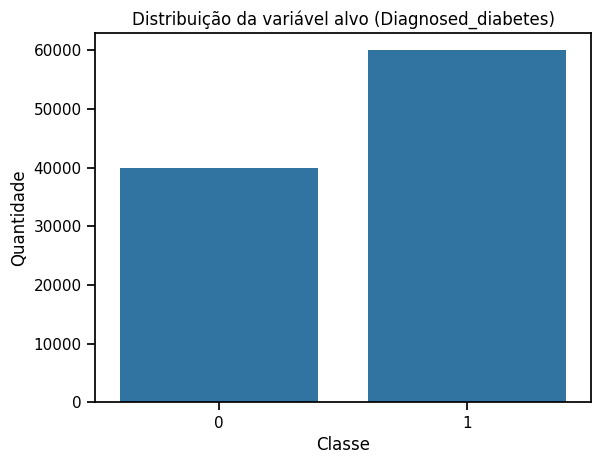

In [ ]:
sns.countplot(x='diagnosed_diabetes', data=df)
plt.title("Distribuição da variável alvo (Diagnosed_diabetes)")
plt.xlabel("Classe")
plt.ylabel("Quantidade")
plt.show()


A distribuição das classes indica a existência de desbalanceamento entre pacientes com e sem diabetes, o que deve ser considerado nas etapas posteriores de modelagem.

## 4.3 Distribuição das variáveis numéricas

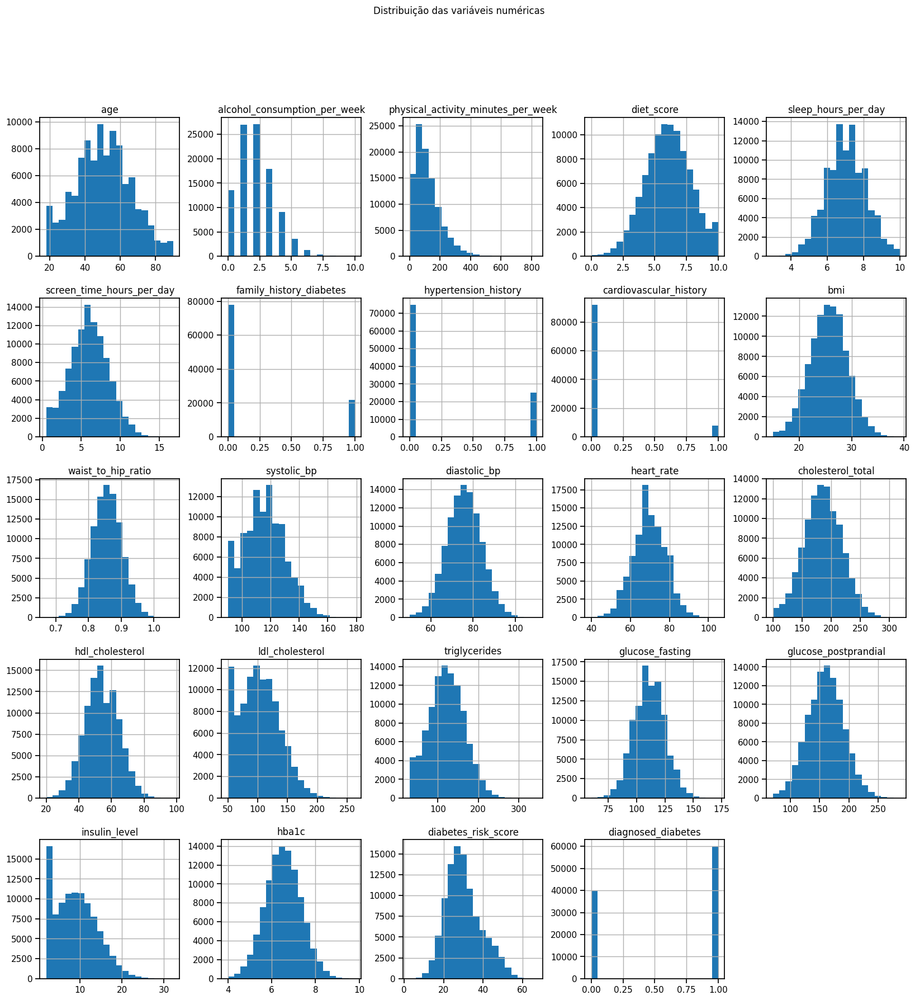

In [ ]:
df.hist(figsize=(20, 20), bins=20)
plt.suptitle("Distribuição das variáveis numéricas", fontsize=12)
plt.show()


## 4.4 Boxplots para análise de outliers

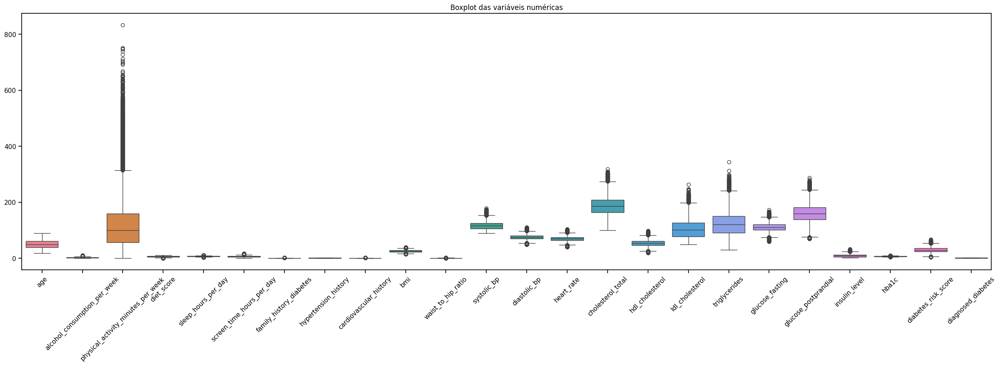

In [ ]:
plt.figure(figsize=(30, 8))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.title("Boxplot das variáveis numéricas")
plt.show()


## 4.5 Correlação entre as variáveis

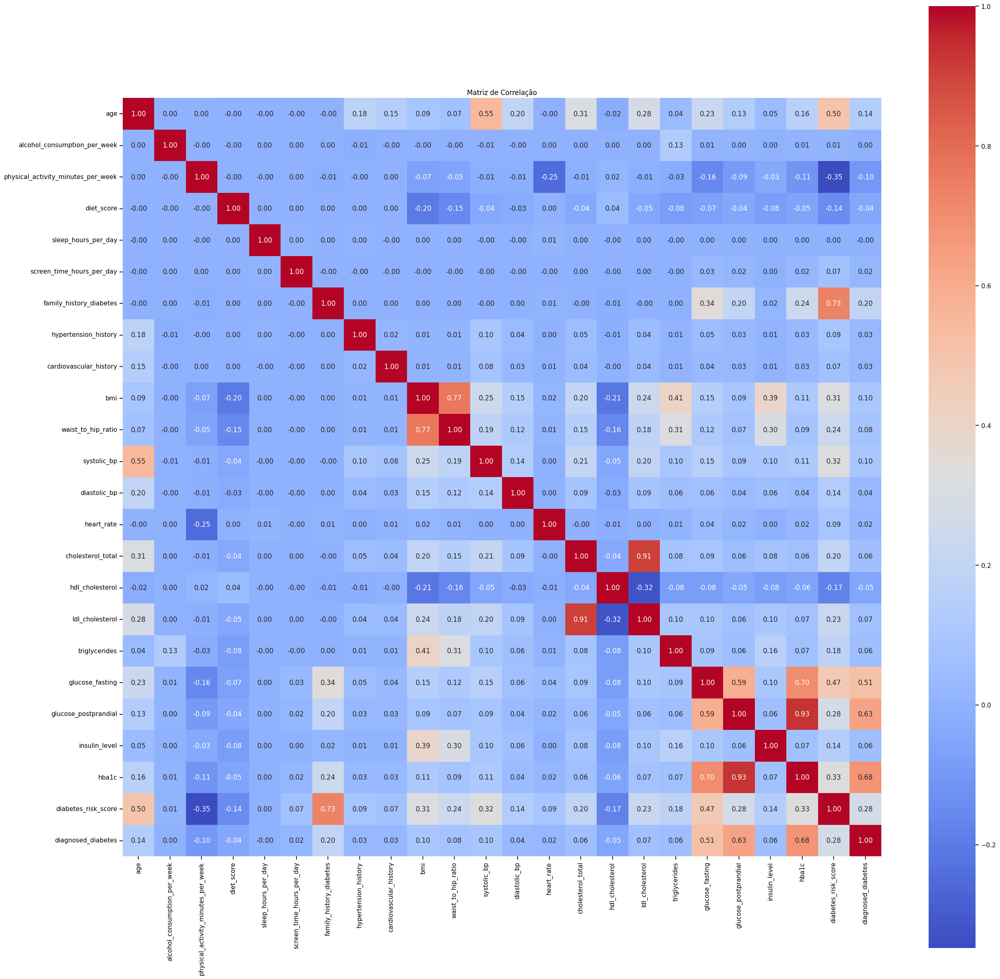

In [ ]:
df_numeric = df.select_dtypes(include=['int64', 'float64'])

corr_matrix = df_numeric.corr()

plt.figure(figsize=(30, 30))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    square=True
)
plt.title("Matriz de Correlação")
plt.show()



A análise de correlação permite identificar possíveis relações lineares entre as variáveis explicativas e a variável alvo, além de possíveis redundâncias entre atributos.

## 4.6 Comparação das variáveis por classe

In [ ]:
df.groupby('diagnosed_diabetes').mean(numeric_only=True)


,age,alcohol_consumption_per_week,physical_activity_minutes_per_week,diet_score,sleep_hours_per_day,screen_time_hours_per_day,family_history_diabetes,hypertension_history,cardiovascular_history,bmi,...,heart_rate,cholesterol_total,hdl_cholesterol,ldl_cholesterol,triglycerides,glucose_fasting,glucose_postprandial,insulin_level,hba1c,diabetes_risk_score
diagnosed_diabetes,,,,,,,,,,,,,,,,,,,,,
0,47.488601,2.00235,129.329184,6.091405,6.998353,5.941670,0.119094,0.236188,0.069347,25.186321,...,69.399255,183.697365,54.686941,100.241213,118.475826,102.610119,136.173041,8.711073,5.843554,27.145025
1,51.875096,2.00455,111.966032,5.930369,6.997462,6.033003,0.286293,0.260542,0.085770,25.896898,...,69.788626,187.498733,53.613320,104.840061,123.454032,116.788926,175.944381,9.294708,6.972295,32.274091


###4.6.1 Glicose em jejum

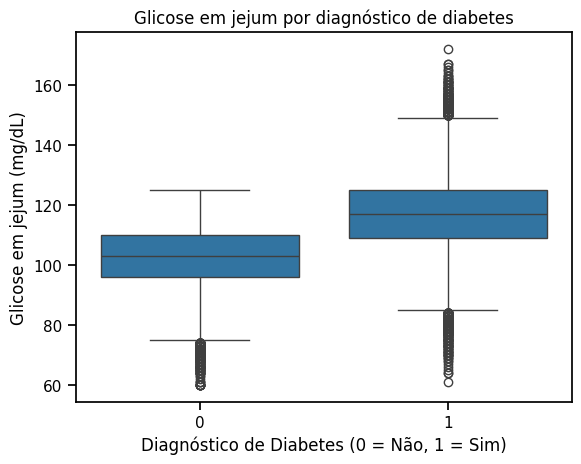

In [ ]:
sns.boxplot(
    x='diagnosed_diabetes',
    y='glucose_fasting',
    data=df
)

plt.title("Glicose em jejum por diagnóstico de diabetes")
plt.xlabel("Diagnóstico de Diabetes (0 = Não, 1 = Sim)")
plt.ylabel("Glicose em jejum (mg/dL)")
plt.show()


###4.6.2 IMC(bmi)

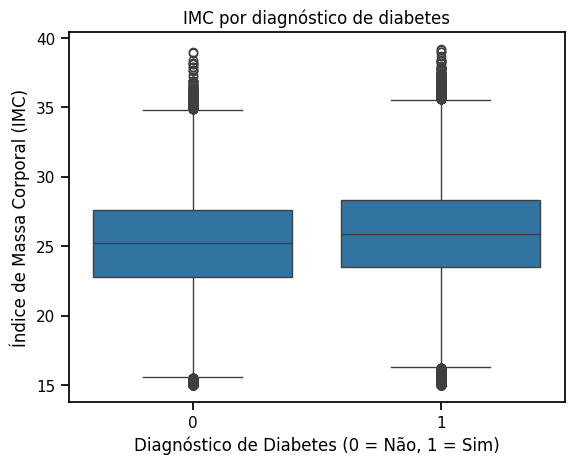

In [ ]:
sns.boxplot(
    x='diagnosed_diabetes',
    y='bmi',
    data=df
)

plt.title("IMC por diagnóstico de diabetes")
plt.xlabel("Diagnóstico de Diabetes (0 = Não, 1 = Sim)")
plt.ylabel("Índice de Massa Corporal (IMC)")
plt.show()


###4.6.3 HbA1c (controle glicêmico)

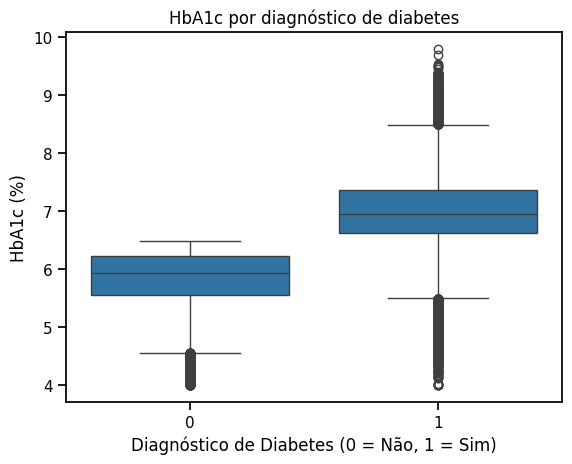

In [ ]:
sns.boxplot(
    x='diagnosed_diabetes',
    y='hba1c',
    data=df
)

plt.title("HbA1c por diagnóstico de diabetes")
plt.xlabel("Diagnóstico de Diabetes (0 = Não, 1 = Sim)")
plt.ylabel("HbA1c (%)")
plt.show()


###4.6.4 Idade

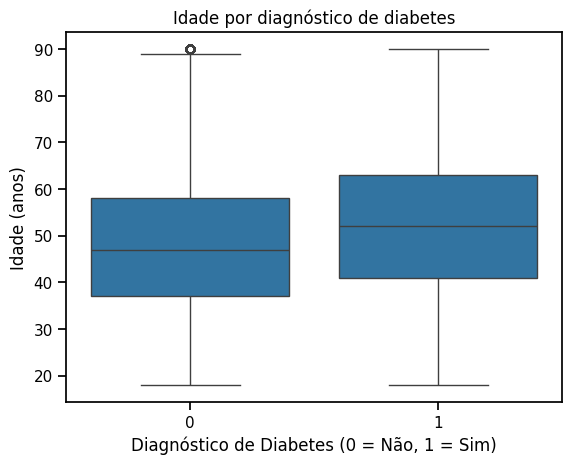

In [ ]:
sns.boxplot(
    x='diagnosed_diabetes',
    y='age',
    data=df
)

plt.title("Idade por diagnóstico de diabetes")
plt.xlabel("Diagnóstico de Diabetes (0 = Não, 1 = Sim)")
plt.ylabel("Idade (anos)")
plt.show()


A análise exploratória dos dados evidenciou diferenças significativas em variáveis clínicas importantes, como a glicose, entre pacientes com e sem diabetes. Além disso, foi possível identificar possíveis outliers e padrões que serão considerados nas etapas de pré-processamento e modelagem.

# 5 - Limpeza e pré-processamento dos dados

## 5.1 Separação entre variáveis explicativas e alvo

In [ ]:
# Variável alvo
y = df['diagnosed_diabetes']

# Variáveis explicativas
X = df.drop(columns=['diagnosed_diabetes', 'diabetes_risk_score', 'diabetes_stage'])

print("Dimensão de X:", X.shape)
print("Dimensão de y:", y.shape)


Dimensão de X: (100000, 28)
Dimensão de y: (100000,)


## 5.2 Verificação de desbalanceamento das classes

In [ ]:
# Proporção das classes
y.value_counts(normalize=True)


,proportion
diagnosed_diabetes,
1,0.59998
0,0.40002


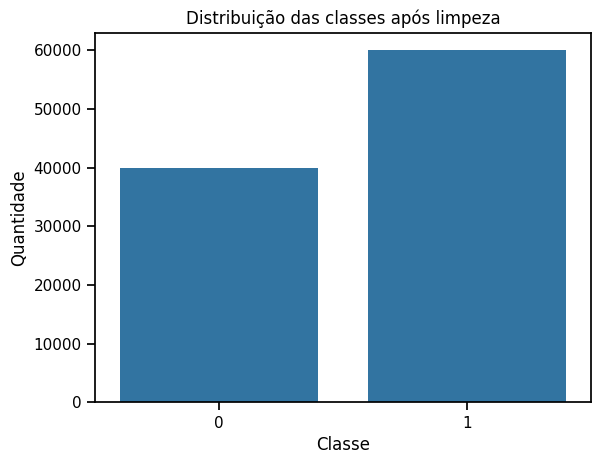

In [ ]:
# Visualização do desbalanceamento
sns.countplot(x=y)
plt.title("Distribuição das classes após limpeza")
plt.xlabel("Classe")
plt.ylabel("Quantidade")
plt.show()


Observa-se um desbalanceamento entre as classes, o que pode impactar o desempenho de alguns modelos e será considerado nas etapas seguintes.

## 5.6 Padronização dos dados

In [ ]:
# Colunas numéricas e categóricas
num_cols = X.select_dtypes(include=['int64', 'float64']).columns
cat_cols = X.select_dtypes(include=['object']).columns

print("Numéricas:", list(num_cols))
print("Categóricas:", list(cat_cols))


Numéricas: ['age', 'alcohol_consumption_per_week', 'physical_activity_minutes_per_week', 'diet_score', 'sleep_hours_per_day', 'screen_time_hours_per_day', 'family_history_diabetes', 'hypertension_history', 'cardiovascular_history', 'bmi', 'waist_to_hip_ratio', 'systolic_bp', 'diastolic_bp', 'heart_rate', 'cholesterol_total', 'hdl_cholesterol', 'ldl_cholesterol', 'triglycerides', 'glucose_fasting', 'glucose_postprandial', 'insulin_level', 'hba1c']
Categóricas: ['gender', 'ethnicity', 'education_level', 'income_level', 'employment_status', 'smoking_status']


In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Pré-processador
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_cols)
    ]
)


In [ ]:
X_scaled = preprocessor.fit_transform(X)
X_scaled


array([[ 0.50495557, -1.41325295,  1.13836305, ...,  0.        ,
         0.        ,  1.        ],
       [-0.13588433, -0.70792076,  0.28537586, ...,  0.        ,
         1.        ,  0.        ],
       [ 0.63312355, -0.70792076, -0.73346993, ...,  1.        ,
         0.        ,  1.        ],
       ...,
       [ 0.44087158,  1.40807581,  0.02474089, ...,  0.        ,
         1.        ,  0.        ],
       [-0.19996832,  0.70274362, -0.79270515, ...,  0.        ,
         0.        ,  1.        ],
       [ 0.12045163, -0.70792076,  1.5293155 , ...,  0.        ,
         0.        ,  1.        ]])

A padronização garante que todas as variáveis tenham média zero e desvio padrão unitário, evitando que atributos em escalas maiores dominem o aprendizado do modelo.

#6 - Separação de dados

## 6.1 Separação em conjunto de treino e teste

In [ ]:
from sklearn.model_selection import train_test_split

# Separação treino/teste (80% treino, 20% teste)
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Dimensão do conjunto de treino:", X_train.shape)
print("Dimensão do conjunto de teste:", X_test.shape)


Dimensão do conjunto de treino: (80000, 40)
Dimensão do conjunto de teste: (20000, 40)


## 6.2 Verificação da proporção das classes

In [ ]:
# Proporção das classes no conjunto de treino
y_train.value_counts(normalize=True)


,proportion
diagnosed_diabetes,
1,0.599975
0,0.400025


In [ ]:
# Proporção das classes no conjunto de teste
y_test.value_counts(normalize=True)


,proportion
diagnosed_diabetes,
1,0.6
0,0.4


Observa-se que a estratificação preservou a distribuição das classes tanto no conjunto de treino quanto no conjunto de teste.

## 6.3 Definição da validação cruzada estratificada

In [ ]:
from sklearn.model_selection import StratifiedKFold

# Validação cruzada estratificada com 5 folds
cv = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

cv


StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

A validação cruzada estratificada foi adotada para garantir uma avaliação mais robusta dos modelos, reduzindo a dependência de uma única divisão dos dados.

## 6.4 Definição das métricas de avaliação

In [ ]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)


Em problemas médicos, métricas como Recall e F1-score são particularmente relevantes, pois penalizam falsos negativos, que representam pacientes com diabetes classificados incorretamente como saudáveis.

Com os dados devidamente separados e uma estratégia de validação bem definida, o experimento está preparado para o treinamento, ajuste e comparação de diferentes modelos de aprendizado de máquina.

#7 - Modelos Baseline

##7.1 - Baseline 1 – Dummy Classifier

In [ ]:
from sklearn.dummy import DummyClassifier

# Dummy Classifier - estratégia: classe mais frequente
dummy_clf = DummyClassifier(strategy="most_frequent", random_state=42)

# Treinamento
dummy_clf.fit(X_train, y_train)

# Previsões
y_pred_dummy = dummy_clf.predict(X_test)


In [ ]:
print("Dummy Classifier")
print(classification_report(y_test, y_pred_dummy))


Dummy Classifier
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      8000
           1       0.60      1.00      0.75     12000

    accuracy                           0.60     20000
   macro avg       0.30      0.50      0.38     20000
weighted avg       0.36      0.60      0.45     20000



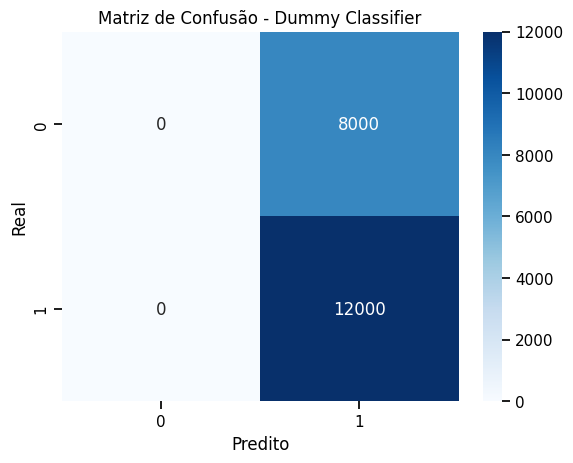

In [ ]:
# Matriz de confusão
cm_dummy = confusion_matrix(y_test, y_pred_dummy)

sns.heatmap(cm_dummy, annot=True, fmt="d", cmap="Blues")
plt.title("Matriz de Confusão - Dummy Classifier")
plt.xlabel("Predito")
plt.ylabel("Real")
plt.show()


O Dummy Classifier serve apenas como referência inicial, pois ignora completamente as características dos pacientes.

##7.2 - Baseline 2 – Regressão Logística (modelo simples)

In [ ]:
from sklearn.linear_model import LogisticRegression

# Regressão Logística com parâmetros padrão
log_reg = LogisticRegression(
    max_iter=1000,
    random_state=42
)

# Treinamento
log_reg.fit(X_train, y_train)

# Previsões
y_pred_lr = log_reg.predict(X_test)


In [ ]:
print("Regressão Logística - Baseline")
print(classification_report(y_test, y_pred_lr))


Regressão Logística - Baseline
              precision    recall  f1-score   support

           0       0.84      0.81      0.82      8000
           1       0.88      0.90      0.89     12000

    accuracy                           0.86     20000
   macro avg       0.86      0.85      0.85     20000
weighted avg       0.86      0.86      0.86     20000



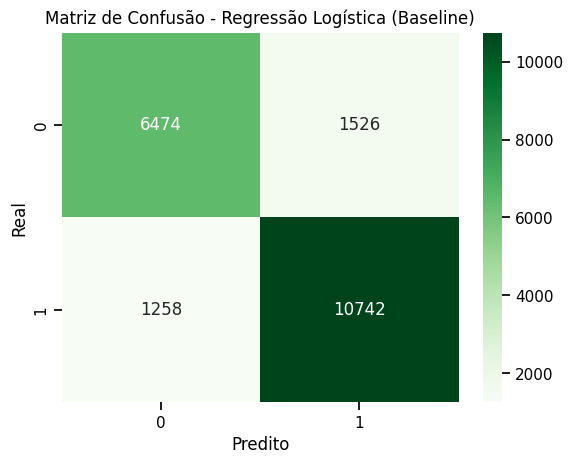

In [ ]:
# Matriz de confusão
cm_lr = confusion_matrix(y_test, y_pred_lr)

sns.heatmap(cm_lr, annot=True, fmt="d", cmap="Greens")
plt.title("Matriz de Confusão - Regressão Logística (Baseline)")
plt.xlabel("Predito")
plt.ylabel("Real")
plt.show()


##7.3 - 7.4 Comparação inicial dos baselines

In [ ]:
# Armazenando métricas dos modelos baseline
baseline_results = pd.DataFrame({
    'Modelo': ['Dummy Classifier', 'Regressão Logística'],
    'Acurácia': [
        accuracy_score(y_test, y_pred_dummy),
        accuracy_score(y_test, y_pred_lr)
    ],
    'Precisão': [
        precision_score(y_test, y_pred_dummy, zero_division=0),
        precision_score(y_test, y_pred_lr)
    ],
    'Recall': [
        recall_score(y_test, y_pred_dummy),
        recall_score(y_test, y_pred_lr)
    ],
    'F1-score': [
        f1_score(y_test, y_pred_dummy),
        f1_score(y_test, y_pred_lr)
    ]
})

baseline_results


,Modelo,Acurácia,Precisão,Recall,F1-score
0,Dummy Classifier,0.6000,0.600000,1.000000,0.750000
1,Regressão Logística,0.8608,0.875611,0.895167,0.885281


A Regressão Logística apresenta desempenho superior ao Dummy Classifier, justificando o uso de modelos mais complexos nas próximas etapas.

Os modelos baseline fornecem uma referência importante para avaliar os ganhos obtidos com técnicas mais avançadas de aprendizado de máquina. A partir desses resultados, procede-se para a avaliação de múltiplos modelos com diferentes estratégias e hiperparâmetros.

#8 - Treinamento e avaliação de múltiplos modelos

##8.1 Estrutura para avaliação com validação cruzada

In [ ]:
from sklearn.model_selection import cross_validate


In [ ]:
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1'
}


##8.2 Lista de Modelos

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

models = {
    'Regressão Logística': LogisticRegression(max_iter=1000, random_state=42),
    'KNN': KNeighborsClassifier(),
    'Árvore de Decisão': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'SVM': SVC(kernel='rbf', random_state=42)
}


##8.3 Avaliação dos modelos com validação cruzada

In [ ]:
results = []

for model_name, model in models.items():
    cv_results = cross_validate(
        model,
        X_train,
        y_train,
        cv=cv,
        scoring=scoring,
        n_jobs=-1
    )

    results.append({
        'Modelo': model_name,
        'Acurácia (CV)': cv_results['test_accuracy'].mean(),
        'Precisão (CV)': cv_results['test_precision'].mean(),
        'Recall (CV)': cv_results['test_recall'].mean(),
        'F1-score (CV)': cv_results['test_f1'].mean()
    })


In [ ]:
# Tabela com os resultados
results_df = pd.DataFrame(results).sort_values(by='F1-score (CV)', ascending=False)
results_df


,Modelo,Acurácia (CV),Precisão (CV),Recall (CV),F1-score (CV)
3,Random Forest,0.921275,0.999593,0.869140,0.929812
4,SVM,0.892188,0.946560,0.869390,0.906334
2,Árvore de Decisão,0.863088,0.879459,0.894391,0.886861
0,Regressão Logística,0.858888,0.873585,0.894204,0.883773
1,KNN,0.812300,0.848001,0.837222,0.842576


Os resultados apresentados correspondem à média das métricas obtidas nos folds da validação cruzada estratificada, proporcionando uma avaliação mais robusta do desempenho dos modelos.

##8.4 Visualização da comparação entre os modelos

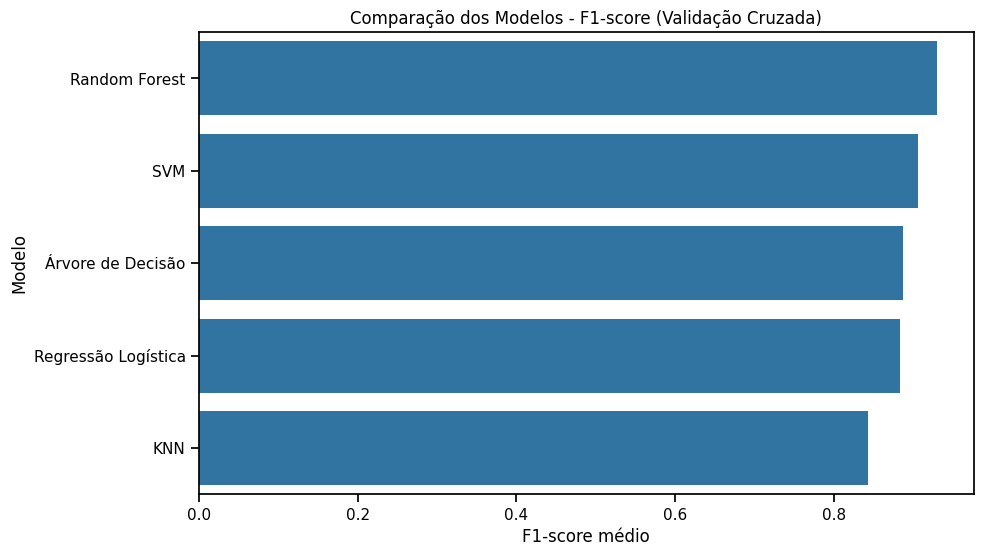

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(
    x='F1-score (CV)',
    y='Modelo',
    data=results_df
)
plt.title("Comparação dos Modelos - F1-score (Validação Cruzada)")
plt.xlabel("F1-score médio")
plt.ylabel("Modelo")
plt.show()


##8.5 Seleção dos melhores modelos

In [ ]:
results_df[['Modelo', 'F1-score (CV)']]


,Modelo,F1-score (CV)
3,Random Forest,0.929812
4,SVM,0.906334
2,Árvore de Decisão,0.886861
0,Regressão Logística,0.883773
1,KNN,0.842576


Observa-se que modelos mais complexos, como Random Forest, apresentam melhor desempenho médio em termos de F1-score, indicando maior capacidade de capturar padrões não lineares nos dados.

A avaliação comparativa dos modelos evidenciou diferenças pouco significativas de desempenho. A validação cruzada estratificada permitiu uma comparação justa, reduzindo o viés associado a uma única divisão dos dados. Na etapa seguinte, será realizado o ajuste de hiperparâmetros dos modelos mais promissores.

#9 - Ajuste de hiperparâmetros (GridSearchCV)

## 9.1 Definição da métrica de otimização

In [ ]:
from sklearn.model_selection import GridSearchCV


##9.1 Ajuste da Random Forest

In [ ]:
param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_rf = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid=param_grid_rf,
    scoring='f1',
    cv=cv,
    n_jobs=-1
)

grid_rf.fit(X_train, y_train)

print("Melhores hiperparâmetros (Random Forest):")
print(grid_rf.best_params_)
print("Melhor F1-score (CV):", grid_rf.best_score_)


Melhores hiperparâmetros (Random Forest):
{'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
Melhor F1-score (CV): 0.9299304306041668


##9.2 Ajuste da Decision Tree

In [ ]:
param_grid_dt = {
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['gini', 'entropy']
}

grid_dt = GridSearchCV(
    DecisionTreeClassifier(random_state=42),
    param_grid=param_grid_dt,
    scoring='f1',
    cv=cv,
    n_jobs=-1
)

grid_dt.fit(X_train, y_train)

print("Melhores hiperparâmetros (Árvore de Decisão):")
print(grid_dt.best_params_)
print("Melhor F1-score (CV):", grid_dt.best_score_)


Melhores hiperparâmetros (Árvore de Decisão):
{'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 2}
Melhor F1-score (CV): 0.9298930834074886


##9.3 Ajuste da Regressão Logística

In [ ]:
param_grid_lr = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l2'],
    'solver': ['lbfgs']
}

grid_lr = GridSearchCV(
    LogisticRegression(max_iter=1000, random_state=42),
    param_grid=param_grid_lr,
    scoring='f1',
    cv=cv,
    n_jobs=-1
)

grid_lr.fit(X_train, y_train)

print("Melhores hiperparâmetros (Regressão Logística):")
print(grid_lr.best_params_)
print("Melhor F1-score (CV):", grid_lr.best_score_)


Melhores hiperparâmetros (Regressão Logística):
{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}
Melhor F1-score (CV): 0.8837785994027044


## 9.6 Comparação dos modelos ajustados

In [ ]:
grid_results = pd.DataFrame({
    'Modelo': ['Regressão Logística', 'Random Forest', 'Decision Tree'],
    'Melhor F1-score (CV)': [
        grid_lr.best_score_,
        grid_rf.best_score_,
        grid_dt.best_score_
    ]
}).sort_values(by='Melhor F1-score (CV)', ascending=False)

grid_results


,Modelo,Melhor F1-score (CV)
1,Random Forest,0.929930
2,Decision Tree,0.929893
0,Regressão Logística,0.883779


O ajuste de hiperparâmetros permitiu melhorar um pouco o desempenho dos modelos em relação às configurações padrão. Dentre os modelos avaliados, aqueles com maior F1-score médio na validação cruzada foram selecionados para avaliação final no conjunto de teste.

#10 - Avaliação Final do Melhor Modelo

##10.1 Seleção do melhor modelo ajustado

In [ ]:
# Selecionando automaticamente o melhor modelo com base no F1-score
best_models = {
    'Regressão Logística': grid_lr,
    'Decision Tree': grid_dt,
    'Random Forest': grid_rf,
}

best_model_name = max(best_models, key=lambda x: best_models[x].best_score_)
best_model = best_models[best_model_name].best_estimator_

print(f"Melhor modelo selecionado: {best_model_name}")
print("Hiperparâmetros finais:")
print(best_model)


Melhor modelo selecionado: Random Forest
Hiperparâmetros finais:
RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, random_state=42)


##10.2 Treinamento final com todo o conjunto de treino

In [ ]:
# Treinando o melhor modelo com todo o conjunto de treino
best_model.fit(X_train, y_train)


RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, random_state=42)

##10.3 Avaliação no conjunto de teste

In [ ]:
# Previsões no conjunto de teste
y_pred_final = best_model.predict(X_test)


In [ ]:
print("Avaliação Final no Conjunto de Teste")
print(classification_report(y_test, y_pred_final))


Avaliação Final no Conjunto de Teste
              precision    recall  f1-score   support

           0       0.83      1.00      0.91      8000
           1       1.00      0.87      0.93     12000

    accuracy                           0.92     20000
   macro avg       0.92      0.93      0.92     20000
weighted avg       0.93      0.92      0.92     20000



##10.4 Matriz de confusão final

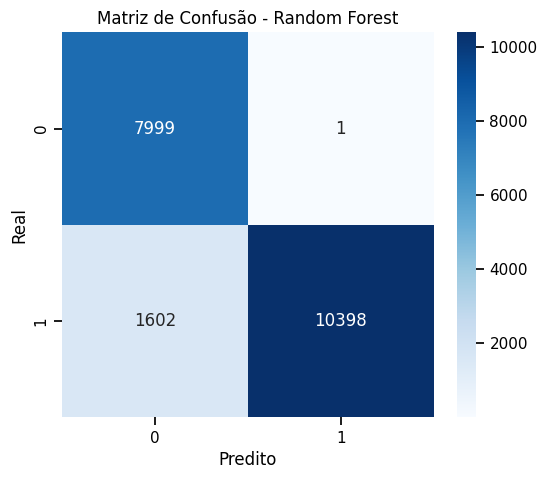

In [ ]:
cm_final = confusion_matrix(y_test, y_pred_final)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_final, annot=True, fmt="d", cmap="Blues")
plt.title(f"Matriz de Confusão - {best_model_name}")
plt.xlabel("Predito")
plt.ylabel("Real")
plt.show()


A matriz de confusão permite analisar os erros cometidos pelo modelo, com especial atenção aos falsos negativos, que representam pacientes com diabetes classificados incorretamente como não diabéticos

##10.5 Métricas finais organizadas em tabela

In [ ]:
final_results = pd.DataFrame({
    'Modelo': [best_model_name],
    'Acurácia': [accuracy_score(y_test, y_pred_final)],
    'Precisão': [precision_score(y_test, y_pred_final)],
    'Recall': [recall_score(y_test, y_pred_final)],
    'F1-score': [f1_score(y_test, y_pred_final)]
})

final_results


,Modelo,Acurácia,Precisão,Recall,F1-score
0,Random Forest,0.91985,0.999904,0.8665,0.928434


## 10.6 Importância das variáveis

In [ ]:
num_features = num_cols
cat_features = preprocessor.named_transformers_['cat'].get_feature_names_out(cat_cols)
feature_names = np.concatenate([num_features, cat_features])


In [ ]:
importances = best_model.feature_importances_

feature_importance = pd.DataFrame({
    'Variável': feature_names,
    'Importância': importances
}).sort_values(by='Importância', ascending=False)


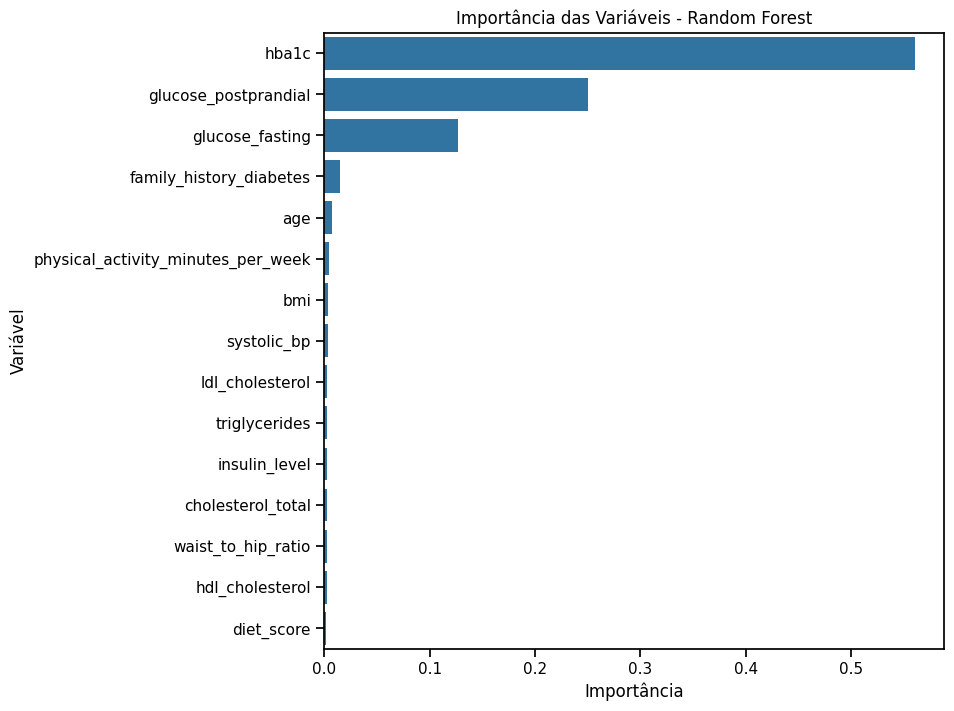

In [ ]:
plt.figure(figsize=(8, 8))
sns.barplot(
    x='Importância',
    y='Variável',
    data=feature_importance.head(15)
)
plt.title("Importância das Variáveis - Random Forest")
plt.show()


A análise de importância das variáveis indica quais características clínicas mais influenciam a decisão do modelo, contribuindo para a interpretabilidade dos resultados.